# Fetal Health Prediction

**Author: Victor Mayowa(MB;BS, Ilorin)**

**Source: [Kaggle](https://www.kaggle.com/datasets/andrewmvd/fetal-health-classification)**

In [ ]:
#!pip install -r module.txt

#### Project Summary:

**1. Overview of the Fetal Health Dataset:**

The fetal health dataset comprises a meticulously curated collection of 2126 records, each containing an array of features extracted from Cardiotocogram (CTG) examinations. These features encapsulate critical parameters such as baseline value, accelerations, fetal movement, uterine contractions, and various other indicators of fetal well-being. Expert obstetricians have judiciously classified these records into three distinct categories: "Normal," "Suspect," and "Pathological," laying the foundation for comprehensive analysis and classification.

**2. Purpose of the Project:**

The primary objective of this project is to harness the power of advanced data science techniques to develop a predictive model capable of accurately classifying fetal health based on the rich CTG data. By doing so, we endeavor to address a critical gap in maternal and neonatal healthcare, aiming to substantially reduce preventable child and maternal mortality rates. Through rigorous data exploration, model development, and evaluation, this project seeks to provide healthcare professionals with a robust tool to assess and intervene in fetal health cases.

**3. Expected Outcomes and Benefits:**

The anticipated outcomes of this project are two-fold. Firstly, we aim to deliver a meticulously designed and thoroughly validated predictive model that can reliably classify fetal health, thereby aiding healthcare providers in timely and accurate decision-making. Secondly, this project aspires to contribute significantly towards achieving the United Nations' Sustainable Development Goals related to maternal and child health. By leveraging CTG data, we endeavor to make substantial strides in reducing child mortality rates and preventing maternal deaths, particularly in resource-constrained settings.

The benefits of this project extend beyond the immediate context, potentially serving as a benchmark for future research in the field of maternal and neonatal healthcare. Furthermore, the development of a robust fetal health classification model holds the promise of revolutionizing prenatal care, ultimately leading to improved outcomes for both mothers and their newborns.

---

This enhanced project summary provides a comprehensive overview, emphasizing the significance and potential impact of the project in the field of maternal and neonatal healthcare. If you have any further specific points to add or refine, feel free to let me know!

#### Abstract
Classify fetal health in order to prevent child and maternal mortality.

#### Context

Reduction of child mortality is reflected in several of the United Nations' Sustainable Development Goals and is a key indicator of human progress.
The UN expects that by 2030, countries end preventable deaths of newborns and children under 5 years of age, with all countries aiming to reduce under‑5 mortality to at least as low as 25 per 1,000 live births.

Parallel to notion of child mortality is of course maternal mortality, which accounts for **295 000 deaths** during and following pregnancy and childbirth (as of 2017). The vast majority of these deaths **(94%)** occurred in low-resource settings, and most could have been prevented.

In light of what was mentioned above, **Cardiotocograms (CTGs)** are a simple and cost accessible option to assess fetal health, allowing healthcare professionals to take action in order to prevent child and maternal mortality. The equipment itself works by sending ultrasound pulses and reading its response, thus shedding light on fetal heart rate (FHR), fetal movements, uterine contractions and more.



#### Data Summary

This dataset contains **2126 records** of features extracted from Cardiotocogram exams, which were then classified by three expert obstetritians into **3 classes:**

* Normal
* Suspect
* Pathological

#### Data Loading

In [ ]:
#!pip install xgboost

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import scipy
import matplotlib.pyplot as plt
#from ydata_profiling import ProfileReport
import warnings

warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)

In [ ]:
import torch
import math
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, BaggingClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import precision_recall_fscore_support, f1_score, accuracy_score, classification_report, confusion_matrix, RocCurveDisplay, PrecisionRecallDisplay
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score

In [ ]:
df = pd.read_csv('/fetal_health.csv')

In [ ]:
df.head(5)

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,mean_value_of_long_term_variability,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,2.4,64.0,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,10.4,130.0,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,13.4,130.0,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,23.0,117.0,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,19.9,117.0,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


In [ ]:
df.shape

(2126, 22)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   float64
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   float64
 8   mean_value_of_short_term_variability  

In [ ]:
data = df.drop_duplicates()

In [ ]:
df.fillna(df.mean(), inplace=True)

In [ ]:
data.shape

(2113, 22)

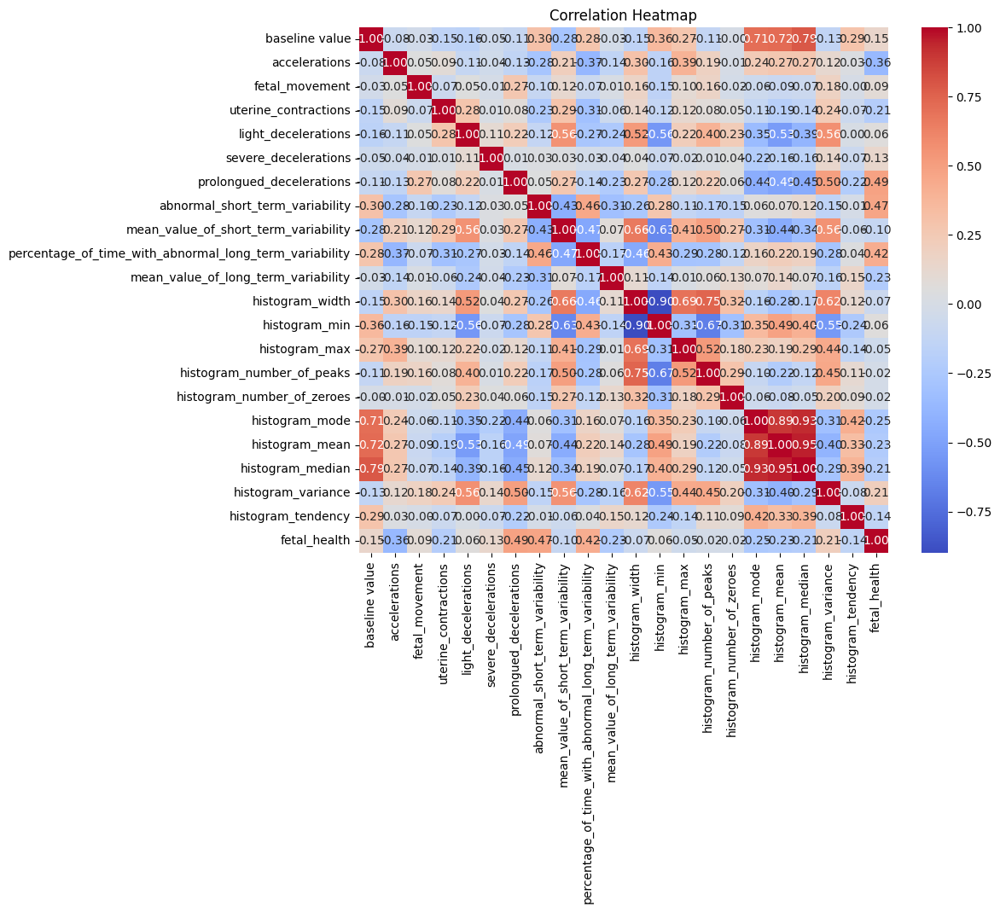

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

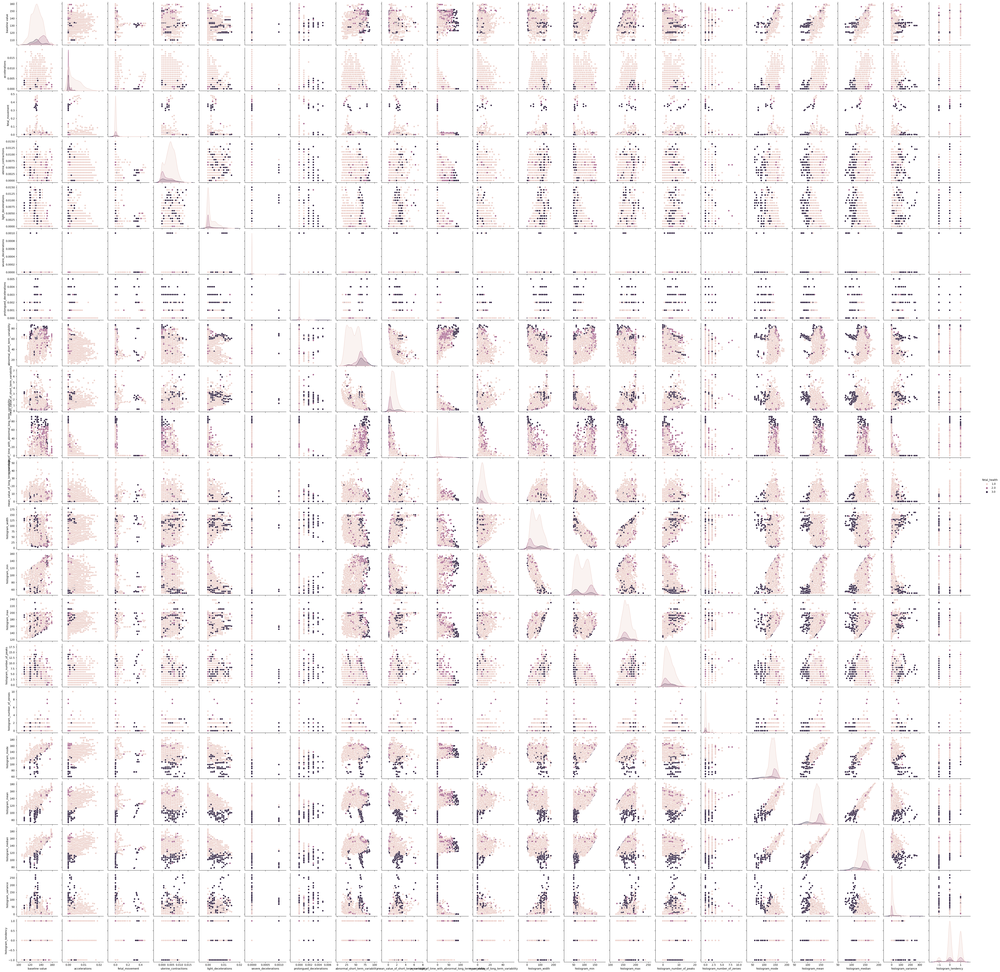

In [ ]:
sns.pairplot(data=data, hue='fetal_health')
plt.show()

In [ ]:
X = data.drop("fetal_health", axis=1)
y = data["fetal_health"]

In [ ]:
# Step 2: Check for Multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Assuming 'X' is your feature data
vif = pd.DataFrame()
vif["Feature"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

In [ ]:
vif

,Feature,VIF
0,baseline value,1055.321150
1,accelerations,4.799435
2,fetal_movement,1.185361
3,uterine_contractions,4.061620
4,light_decelerations,4.804761
5,severe_decelerations,1.136484
6,prolongued_decelerations,2.929959
7,abnormal_short_term_variability,16.026207
8,mean_value_of_short_term_variability,9.447232
9,percentage_of_time_with_abnormal_long_term_var...,2.410591


Here's a brief interpretation of the VIF values:

A VIF of 1 indicates no multicollinearity.
VIF values between 1 and 5 suggest moderate multicollinearity.
VIF values above 5 indicate high multicollinearity.
Based on the VIF values you provided:

Features like 'baseline value', 'abnormal_short_term_variability', 'mean_value_of_short_term_variability', 'histogram_width', 'histogram_min', 'histogram_max', 'histogram_mode', 'histogram_mean', and 'histogram_median' have high VIF values, indicating potential multicollinearity issues.
Features like 'accelerations', 'fetal_movement', 'uterine_contractions', 'light_decelerations', 'severe_decelerations', 'prolongued_decelerations', 'percentage_of_time_with_abnormal_long_term_variability', 'mean_value_of_long_term_variability', 'histogram_number_of_peaks', 'histogram_number_of_zeroes', 'histogram_variance', and 'histogram_tendency' have relatively lower VIF values, suggesting lower multicollinearity.

In [ ]:
# removing some of the data with high multicollinearity
data = data.drop(columns=[ 'abnormal_short_term_variability',  'histogram_width', 'histogram_min', 'histogram_mode', 'histogram_mean'])

In [ ]:
data.shape

(2113, 17)

In [ ]:
X = data.drop("fetal_health", axis=1)
y = data["fetal_health"]

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Apply random oversampling to balance the classes for both X and y
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X_train, y_train)

In [ ]:
y_resampled.value_counts()

1.0    1305
3.0    1305
2.0    1305
Name: fetal_health, dtype: int64

In [ ]:
# Scale the features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_resampled)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Feature Selection using SelectKBest
k = 16 # Number of top features to select
selector = SelectKBest(score_func=f_classif, k=k)
X_train_selected = selector.fit_transform(X_train_scaled, y_resampled)
X_test_selected = selector.transform(X_test_scaled)

# Train and evaluate a Random Forest classifier with SelectKBest
rf_with_selectk = RandomForestClassifier(random_state=42)
rf_with_selectk.fit(X_train_selected, y_resampled)
y_pred_selectk = rf_with_selectk.predict(X_test_selected)
accuracy_selectk = accuracy_score(y_test, y_pred_selectk)

# Print results
print("Accuracy with SelectKBest:", accuracy_selectk)
print("Classification Report with SelectKBest:\n", classification_report(y_test, y_pred_selectk))

Accuracy with SelectKBest: 0.9361702127659575
Classification Report with SelectKBest:
               precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       341
         2.0       0.79      0.76      0.77        54
         3.0       0.90      0.93      0.91        28

    accuracy                           0.94       423
   macro avg       0.88      0.88      0.88       423
weighted avg       0.94      0.94      0.94       423



In [ ]:
# Dimensionality Reduction using PCA
# Try different values of n_components and evaluate performance
for n_components in [10, 12, 16]:
    pca = PCA(n_components=n_components)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    # Train and evaluate a Random Forest classifier with PCA
    rf_with_pca = RandomForestClassifier(random_state=42)
    rf_with_pca.fit(X_train_pca, y_resampled)
    y_pred_pca = rf_with_pca.predict(X_test_pca)
    accuracy_pca = accuracy_score(y_test, y_pred_pca)

    # Print results for each value of n_components
    print(f"Accuracy with PCA (n_components={n_components}):", accuracy_pca)
    print(f"Classification Report with PCA (n_components={n_components}):\n", classification_report(y_test, y_pred_pca))

Accuracy with PCA (n_components=10): 0.9101654846335697
Classification Report with PCA (n_components=10):
               precision    recall  f1-score   support

         1.0       0.93      0.96      0.95       341
         2.0       0.71      0.63      0.67        54
         3.0       0.96      0.86      0.91        28

    accuracy                           0.91       423
   macro avg       0.87      0.82      0.84       423
weighted avg       0.91      0.91      0.91       423

Accuracy with PCA (n_components=12): 0.9125295508274232
Classification Report with PCA (n_components=12):
               precision    recall  f1-score   support

         1.0       0.93      0.96      0.95       341
         2.0       0.73      0.65      0.69        54
         3.0       1.00      0.82      0.90        28

    accuracy                           0.91       423
   macro avg       0.89      0.81      0.84       423
weighted avg       0.91      0.91      0.91       423

Accuracy with PCA (n_com

#### Data Preprocessing

#### Exploratory Data Analysis

#### Model development

The choice of evaluation metric depends on the specific goals and characteristics of your classification problem. Here's a brief overview of when to use each metric:

##### Accuracy:

When to use: Accuracy is a commonly used metric and is appropriate when all classes are of equal importance and misclassification costs are similar. It's a good initial metric to get an overall sense of model performance.

##### Precision and Recall:

When to use:
Precision: Use when minimizing false positives is a priority. For example, in a medical context, you want to avoid misdiagnosing a healthy patient as sick (Type I error).
Recall: Use when minimizing false negatives is a priority. For example, in a medical context, you want to avoid missing a genuinely sick patient (Type II error).

##### F1 Score:

When to use: The F1 score is the harmonic mean of precision and recall. It is useful when you want to balance both false positives and false negatives. It can be a good metric if there is an uneven class distribution or if false positives and false negatives have different costs.

##### F-beta Score:

When to use: Similar to the F1 score, the F-beta score allows you to weigh precision and recall differently. You can adjust the value of beta to emphasize either precision or recall more.

**In the context of fetal health classification, it is often crucial to have a good balance between sensitivity (recall) and specificity (precision). Misclassifying either normal or pathological cases can have serious implications. Therefore, the F1 score or a variant like the F-beta score may be a suitable metric, as they provide a balanced assessment of both false positives and false negatives.**

classifiers = dict(
    k_nn=KNeighborsClassifier(n_neighbors=2),
    mlp=MLPClassifier(alpha=1, max_iter=100),
    svm=SVC(probability=True),
    random_forest=RandomForestClassifier(random_state=42),
    gradientboost=GradientBoostingClassifier(),
    adaboost=AdaBoostClassifier(),
    xgboost=XGBClassifier(),
)

In [68]:
classifiers = {
    'SVC': SVC(),
    'RandomForest': RandomForestClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'Bagging': BaggingClassifier(),
    'GradientBoost': GradientBoostingClassifier(),
    'XGBClassifier': XGBClassifier(),
    'MLP': MLPClassifier()
}

# Define the hyperparameters for each classifier
parameters = {
    'SVC': {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf']},
    'RandomForest': {'n_estimators': [50, 100, 200], 'max_depth': [None, 5, 10]},
    'AdaBoost': {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]},
    'Bagging': {'n_estimators': [50, 100, 200], 'max_samples': [0.5, 1.0]},
    'GradientBoost': {'n_estimators': [100, 200], 'learning_rate': [1e-1, 5e-2, 1e-2, 5e-3], 'max_depth': [3, 4, 5]},
    'XGBClassifier': {'booster': ['gbtree', 'gblinear', 'dart'], 'eta': [0.1, 0.2, 0.3, 0.4], 'alpha': [0.1, 0.2, 0.3, 0.4, 0.6]},
    'MLP': {'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
            'activation': ['tanh', 'relu'],
            'solver': ['sgd', 'adam'],
            'alpha': [0.0001, 0.05],
            'learning_rate': ['constant','adaptive']}
}


In [70]:
import pandas as pd
from sklearn.metrics import precision_score, recall_score, fbeta_score, f1_score, accuracy_score

# Assuming you have already performed the GridSearchCV and have the results

# Define a list of classifier names
classifier_names = ['SVC', 'RandomForest', 'AdaBoost', 'Bagging', 'GradientBoost', 'MLP', 'XGBClassifier']

# Create an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['Classifier', 'Metric', 'Value'])
metrics = ['Precision', 'Recall', 'F-beta Score', 'F1 Score', 'Accuracy']

# Iterate through classifiers and get evaluation metrics
for classifier_name, classifier in classifiers.items():
    print(f"Grid Search for {classifier_name}:")
    grid_search = GridSearchCV(classifier, parameters[classifier_name], cv=5, scoring='f1_weighted')
    grid_search.fit(X_train_scaled, y_resampled)
    print(f"Best Parameters: {grid_search.best_params_}")
    print(f"Best Cross-validated Score: {grid_search.best_score_}")
    print(f"Test Accuracy: {grid_search.score(X_test_scaled, y_test)}")
    print("\n")
    y_pred = grid_search.predict(X_test_scaled)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    fbeta = fbeta_score(y_test, y_pred, beta=1, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    accuracy = accuracy_score(y_test, y_pred)

    metrics_values = [precision, recall, fbeta, f1, accuracy]

    # Create a DataFrame for the current classifier's metrics
    classifier_df = pd.DataFrame({
        'Classifier': [classifier_name]*len(metrics),
        'Metric': metrics,
        'Value': metrics_values
    })

    # Append the classifier's metrics to the results DataFrame
    results_df = pd.concat([results_df, classifier_df], axis=0)

# Set multi-index for precision and recall
results_df.set_index(['Classifier', 'Metric'], inplace=True)

# Display the results DataFrame
print(results_df)

Grid Search for SVC:
Best Parameters: {'C': 10, 'kernel': 'rbf'}
Best Cross-validated Score: 0.9442683657347715
Test Accuracy: 0.9204634850503587


Grid Search for RandomForest:
Best Parameters: {'max_depth': None, 'n_estimators': 50}
Best Cross-validated Score: 0.983595241871434
Test Accuracy: 0.9359593971040844


Grid Search for AdaBoost:
Best Parameters: {'learning_rate': 1, 'n_estimators': 50}
Best Cross-validated Score: 0.8555190343229864
Test Accuracy: 0.9134048897318909


Grid Search for Bagging:
Best Parameters: {'max_samples': 1.0, 'n_estimators': 50}
Best Cross-validated Score: 0.9835851998599032
Test Accuracy: 0.9218930730362775


Grid Search for GradientBoost:
Best Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}
Best Cross-validated Score: 0.9851375429568187
Test Accuracy: 0.9516536482913538


Grid Search for XGBClassifier:


ValueError: ignored

#### Model Evaluation

In [71]:
# Initialize the Random Forest Classifier with the best parameters
gb_model = GradientBoostingClassifier(learning_rate=0.1, n_estimators=200, max_depth=5)

# Assuming 'X_train' is your training set and 'y_train' are the corresponding labels
gb_model.fit(X_train_scaled, y_resampled)

GradientBoostingClassifier(max_depth=5, n_estimators=200)

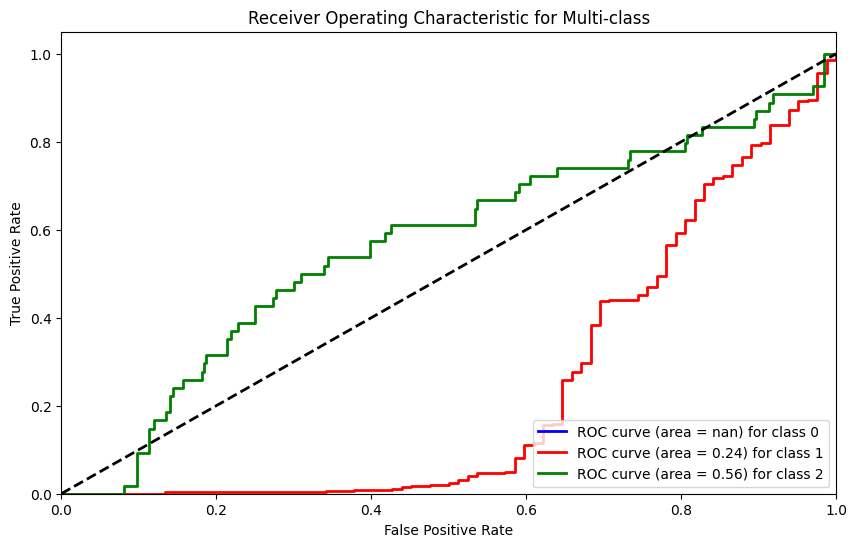

In [80]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming 'y_test' and 'y_pred_proba' are your true labels and predicted probabilities
n_classes = len(np.unique(y_test))

# Binarize the output
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])  # Adjust classes if needed

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 6))
colors = ['blue', 'red', 'green']  # Adjust colors if needed

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i], lw=2,
             label='ROC curve (area = %0.2f) for class %s' % (roc_auc[i], i))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Multi-class')
plt.legend(loc="lower right")
plt.show()


Classification Report:
              precision    recall  f1-score   support

         1.0       0.96      0.98      0.97       341
         2.0       0.88      0.78      0.82        54
         3.0       1.00      0.93      0.96        28

    accuracy                           0.95       423
   macro avg       0.94      0.90      0.92       423
weighted avg       0.95      0.95      0.95       423



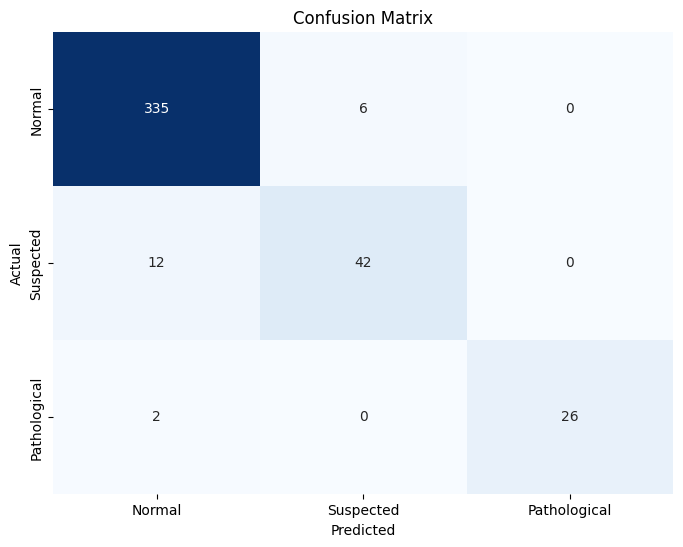

In [84]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Assuming 'y_true' is the true labels and 'y_pred' is the predicted labels
 # Replace with your predicted labels

# Generate classification report
report = classification_report(y_test, y_pred)

print("Classification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Normal', 'Suspected', 'Pathological'], yticklabels=['Normal', 'Suspected', 'Pathological'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


#### Model saving

In [85]:
import joblib

# Save the model as a pickle file
joblib.dump(gb_model, 'best_model.pkl')

['best_model.pkl']

#### Model Deployment